# **Зебрируем лошадей, лошадируем зебр**

## **Импорт библиотек**

In [1]:
import os
import numpy as np
import random
import torch
import torch.nn as nn
import torchvision.utils as vutils
import torchvision.datasets as dset
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pylab as plt
import ipywidgets

## **Загрузка данных**

In [2]:
if not os.path.exists('./horse2zebra'):
    !pip install gdown -qq
    import gdown
    url = 'https://drive.google.com/uc?id=1jPelB2jzNZJq3ZU9Uk_Mkt4MJtF3DRgg'
    gdown.download(url, './horse2zebra.zip', quiet=False)
    !unzip ./horse2zebra.zip > /dev/null

Downloading...
From (original): https://drive.google.com/uc?id=1jPelB2jzNZJq3ZU9Uk_Mkt4MJtF3DRgg
From (redirected): https://drive.google.com/uc?id=1jPelB2jzNZJq3ZU9Uk_Mkt4MJtF3DRgg&confirm=t&uuid=3cd9f283-c3fc-4557-8b1f-62e539ee8864
To: /kaggle/working/horse2zebra.zip
100%|██████████| 117M/117M [00:03<00:00, 37.2MB/s] 


In [3]:
import shutil

# shutil.move("/content/horse2zebra/train/A", "/content/horses_train/A")
# shutil.move("/content/horse2zebra/train/B", "/content/zebra_train/B")
# shutil.move("/content/horse2zebra/test/A", "/content/horses_test/A")
# shutil.move("/content/horse2zebra/test/B", "/content/zebra_test/B")

shutil.move("/kaggle/working/horse2zebra/train/A", "/kaggle/working/horses_train/A")
shutil.move("/kaggle/working/horse2zebra/train/B", "/kaggle/working/zebra_train/B")
shutil.move("/kaggle/working/horse2zebra/test/A", "/kaggle/working/horses_test/A")
shutil.move("/kaggle/working/horse2zebra/test/B", "/kaggle/working/zebra_test/B")

'/kaggle/working/zebra_test/B'

torch.Size([5, 3, 256, 256])


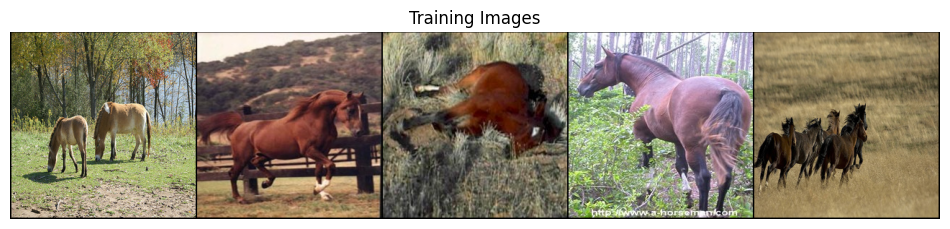

In [4]:
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = 5
IMAGE_SIZE = (256, 256)

DATA_ROOT_HTRAIN = './horses_train/'
dataset_horses_train = dset.ImageFolder(
    root=DATA_ROOT_HTRAIN,
    transform=transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ])
    )

dataloader_train_horses = DataLoader(
    dataset_horses_train, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=os.cpu_count()
    )

real_batch = next(iter(dataloader_train_horses))
print(real_batch[0].shape)
plt.figure(figsize=(12, 4))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(
    vutils.make_grid(
        real_batch[0].to(DEVICE)[:10],
        padding=2, normalize=True
        ).cpu(), (1, 2, 0)
    ));

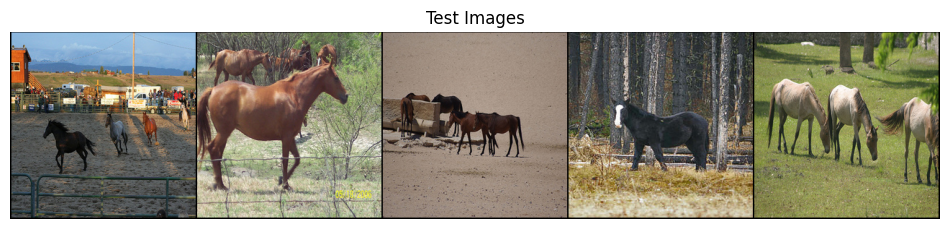

In [5]:
DATA_ROOT_HTEST = './horses_test/'
dataset_horses_test = dset.ImageFolder(
    root=DATA_ROOT_HTEST,
    transform=transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1))
        ])
    )

dataloader_test_horses = torch.utils.data.DataLoader(
    dataset_horses_test, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=os.cpu_count()
    )

real_batch = next(iter(dataloader_test_horses))
plt.figure(figsize=(12, 4))
plt.axis("off")
plt.title("Test Images")
plt.imshow(np.transpose(
    vutils.make_grid(
        real_batch[0].to(DEVICE)[:10],
        padding=2, normalize=True
        ).cpu(), (1, 2, 0)
    ));

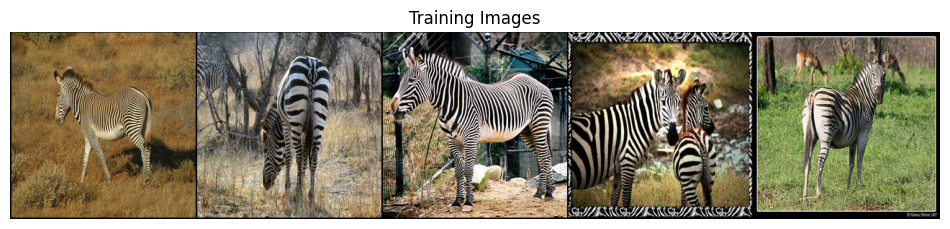

In [6]:
DATA_ROOT_ZTRAIN = './zebra_train/'
dataset_zebra_train = dset.ImageFolder(
    root=DATA_ROOT_ZTRAIN,
    transform=transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ])
    )

dataloader_zebra_train = torch.utils.data.DataLoader(
    dataset_zebra_train, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=os.cpu_count()
    )

real_batch = next(iter(dataloader_zebra_train))
plt.figure(figsize=(12, 4))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(
    vutils.make_grid(
        real_batch[0].to(DEVICE)[:10],
        padding=2, normalize=True
        ).cpu(), (1, 2, 0)
    ));

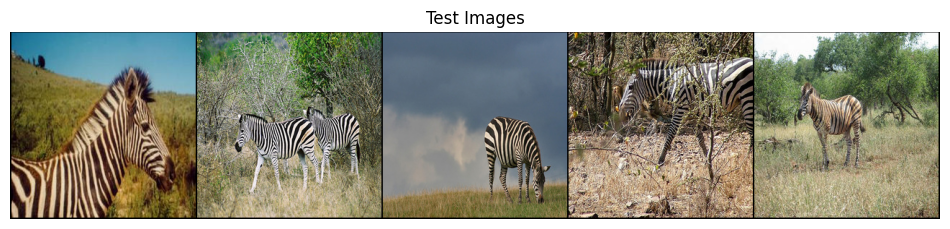

In [7]:
DATA_ROOT_ZTEST = './zebra_test/'
dataset_zebra_test = dset.ImageFolder(
    root=DATA_ROOT_ZTEST,
    transform=transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.CenterCrop(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1))
        ])
    )

dataloader_zebra_test = torch.utils.data.DataLoader(
    dataset_zebra_test, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=os.cpu_count()
    )

real_batch = next(iter(dataloader_zebra_test))
plt.figure(figsize=(12, 4))
plt.axis("off")
plt.title("Test Images")
plt.imshow(np.transpose(
    vutils.make_grid(
        real_batch[0].to(DEVICE)[:10],
        padding=2, normalize=True
        ).cpu(),(1, 2, 0)
    ));

In [8]:
def plot_images_test(dataloader_test_horses, dataloader_zebra_test):
    batch_a_test = next(iter(dataloader_test_horses))[0].to(DEVICE)
    real_a_test = batch_a_test.cpu().detach()
    fake_b_test = G_A2B(batch_a_test).cpu().detach()


    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (real_a_test[:4]+1)/2, padding=2, normalize=True
        ).cpu(), (1, 2, 0)))
    plt.axis("off")
    plt.title("Real horses")
    plt.show()


    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (fake_b_test[:4]+1)/2, padding=2, normalize=True
        ).cpu(), (1, 2, 0)))
    plt.axis("off")
    plt.title("Fake zebras")
    plt.show()


    batch_b_test = next(iter(dataloader_zebra_test))[0].to(DEVICE)
    real_b_test = batch_b_test.cpu().detach()
    fake_a_test = G_B2A(batch_b_test).cpu().detach()

    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (real_b_test[:4]+1)/2, padding=2, normalize=True
        ).cpu(), (1, 2, 0)))
    plt.axis("off")
    plt.title("Real zebras")
    plt.show()


    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (fake_a_test[:4]+1)/2, padding=2, normalize=True
        ).cpu(), (1, 2, 0)))
    plt.axis("off")
    plt.title("Fake horses")
    plt.show()

In [9]:
def plot_all_images(
    image_number, dataloader_test_horses, dataloader_zebra_test):
    # Генерация фэйковых зебр
    batch_a_test = next(iter(dataloader_test_horses))[0].to(DEVICE)
    real_a_test = batch_a_test.cpu().detach()
    fake_b_test = G_A2B(batch_a_test ).cpu().detach()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (real_a_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Real horses")
    plt.show()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (fake_b_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Fake zebras")
    plt.show()

    # Генерация фэйковых лошадей
    batch_b_test = next(iter(dataloader_zebra_test))[0].to(DEVICE)
    real_b_test = batch_b_test.cpu().detach()
    fake_a_test = G_B2A(batch_b_test).cpu().detach()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (real_b_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Real zebras")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid(
        (fake_a_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Fake horses")
    plt.show()

    # Идентификация
    identity_a_test=G_B2A(batch_a_test.cuda()).cpu().detach()
    identity_b_test=G_A2B(batch_b_test.cuda()).cpu().detach()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (identity_a_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Identity horses")
    plt.show()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (identity_b_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Identity zebras")
    plt.show()

    #Восстановленные изображения
    recover_a_test=G_B2A(fake_b_test.cuda()).cpu().detach()
    recover_b_test=G_A2B(fake_a_test.cuda()).cpu().detach()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (recover_a_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Recovered horses")
    plt.show()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(vutils.make_grid(
        (recover_b_test[:image_number]+1)/2, padding=2, normalize=True
        ).cpu(),(1, 2, 0)))
    plt.axis("off")
    plt.title("Recovered zebras")
    plt.show()

In [10]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [11]:
# def save_models(G_A2B, G_B2A, D_A, D_B, name):
#     torch.save(G_A2B, "/content/gdrive/My Drive/model/"+name+"_G_A2B.pt")
#     torch.save(G_B2A, "/content/gdrive/My Drive/model/"+name+"_G_B2A.pt")
#     torch.save(D_A, "/content/gdrive/My Drive/model/"+name+"_D_A.pt")
#     torch.save(D_B, "/content/gdrive/My Drive/model/"+name+"_D_B.pt")

# def load_models( name):
#     G_A2B=torch.load("/content/gdrive/My Drive/model/"+name+"_G_A2B.pt")
#     G_B2A=torch.load("/content/gdrive/My Drive/model/"+name+"_G_B2A.pt")
#     D_A=torch.load("/content/gdrive/My Drive/model/"+name+"_D_A.pt")
#     D_B=torch.load("/content/gdrive/My Drive/model/"+name+"_D_B.pt")
#     return G_A2B, G_B2A, D_A, D_B


def save_models(G_A2B, G_B2A, D_A, D_B, name):
    torch.save(G_A2B, "/kaggle/working/model/"+name+"_G_A2B.pt")
    torch.save(G_B2A, "/kaggle/working/model/"+name+"_G_B2A.pt")
    torch.save(D_A, "/kaggle/working/model/"+name+"_D_A.pt")
    torch.save(D_B, "/kaggle/working/model/"+name+"_D_B.pt")

def load_models( name):
    G_A2B=torch.load("/kaggle/working/model/"+name+"_G_A2B.pt")
    G_B2A=torch.load("/kaggle/working/model/"+name+"_G_B2A.pt")
    D_A=torch.load("/kaggle/working/model/"+name+"_D_A.pt")
    D_B=torch.load("/kaggle/working/model/"+name+"_D_B.pt")
    return G_A2B, G_B2A, D_A, D_B

### **Генератор**

1. Одна из целей генератора - заставить дискриминатор поверить в реальность
поддельных изображений. Чтобы генератор отлично справлялся с обманом дискриминатора, дискриминатор должен выводить все единицы для сгенерированного изображения. В этом случае генератор получит нулевые потери:

$$min_GLOSS(G)=\frac{1}{2}E(D(G(real))-1)^2.$$

2. Мы накладываем ограничения на генератор. Мы хотим, чтобы генератор мог сначала отображать домен одного класса в домен другого класса, а затем обратно в домен первого класса без каких-либо изменений изображения. Это ограничение накладывается с помощью функции потерь L1 на пиксельном уровне между реальным и восстановленным изображением:

$$L_1=\sum|image_{real}-image_{restored}|.$$

3. Потеря идентичности: если входное изображение уже выглядит как целевой домен, генератор не должен отображать его в другое изображение (например, лошадь не должна реконструироваться в лошадь):

$$L_1=\sum|image_{real}-image_{restored}|.$$

#### **Архитектура генератора**

Генератор состоит из трех основных компонентов: фазы кодирования, трансформации и декодирования.

**Кодировка**:
На этапе кодирования элементы изображения преобразуются в представление скрытого пространства через несколько слоев свертки.

**Трансформация**:
Фаза трансформации состоит из шести или девяти блоков resnet сети и используется для сборки соответствующих скрытых фичей, получанных на этапе кодирования.

**Декодирование**:
Фаза декодирования противоположна фазе кодирования и восстанваливает изображение из скрытого представления с помощью транспонированных сверток.

![image.png](attachment:image.png)

In [12]:
norm_layer = nn.InstanceNorm2d
class ResBlock(nn.Module):
    def __init__(self, f):
        super(ResBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(f, f, 3, 1, 1),
            norm_layer(f), nn.ReLU(),
            nn.Conv2d(f, f, 3, 1, 1)
            )
        self.norm = norm_layer(f)
    def forward(self, x):
        return F.relu(self.norm(self.conv(x)+x))

class Generator(nn.Module):
    def __init__(self, f=64, blocks=9):
        super(Generator, self).__init__()
        layers = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(3, f, 7, 1, 0), norm_layer(  f), nn.ReLU(True),
            nn.Conv2d(f, 2*f, 3, 2, 1), norm_layer(2*f), nn.ReLU(True),
            nn.Conv2d(2*f, 4*f, 3, 2, 1), norm_layer(4*f), nn.ReLU(True)
            ]
        for i in range(int(blocks)):
            layers.append(ResBlock(4*f))
        layers.extend([
            nn.ConvTranspose2d(4*f, 4*2*f, 3, 1, 1),
            nn.PixelShuffle(2), norm_layer(2*f), nn.ReLU(True),
            nn.ConvTranspose2d(2*f,   4*f, 3, 1, 1),
            nn.PixelShuffle(2), norm_layer(  f), nn.ReLU(True),
            nn.ReflectionPad2d(3), nn.Conv2d(f, 3, 7, 1, 0),
            nn.Tanh()
            ])
        self.conv = nn.Sequential(*layers)

    def forward(self, x):
        return self.conv(x)

### **Дискриминатор**

Цель дискриминатора состоит в том, чтобы классифицировать реальное изображение как реальное, а поддельное как поддельное, для оптимизации используется следующая функция наименьших квадратов:

$$min_D(D) =\frac{1}{2}E((D(image_{real})-1)^2+\frac{1}{2}E((D(G(image_{fake}))^2) $$


#### **Архитектура дискриминатора**

![image.png](attachment:image.png)

In [13]:
nc=3
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Размер входного изображения: (nc) x 128 x 128
            nn.Conv2d(nc, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 64 * 2, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(64 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64*2, 64 * 4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(64 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64 * 4, 64 * 8, 4, 1, 1),
            nn.InstanceNorm2d(64 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64 * 8, 1, 4, 1, 1)
        )

    def forward(self, input):
        return self.main(input)

### **Loss функция**

In [14]:
def LSGAN_D(real, fake):
    return (torch.mean((real - 1)**2) + torch.mean(fake**2))

def LSGAN_G(fake):
    return  torch.mean((fake - 1)**2)

## **Обучение модели**

In [15]:
G_A2B = Generator().to(DEVICE)
G_B2A = Generator().to(DEVICE)
D_A = Discriminator().to(DEVICE)
D_B = Discriminator().to(DEVICE)

criterion_Im = torch.nn.L1Loss()

# Параметры оптимизатора
lr = 0.0002
beta1 = 0.5

In [16]:
REP_FREQ = 5

def training(G_A2B, G_B2A, D_A, D_B, num_epochs, name):
    img_list = []
    G_losses = []
    D_A_losses = []
    D_B_losses = []


    iters=0
    FDL_A2B = []
    FDL_B2A = []
    CL_A = []
    CL_B = []
    ID_B2A = []
    ID_A2B = []
    disc_A = []
    disc_B = []


    FDL_A2B_t = []
    FDL_B2A_t = []
    CL_A_t = []
    CL_B_t = []
    ID_B2A_t = []
    ID_A2B_t = []
    disc_A_t = []
    disc_B_t = []

    print("Starting Training Loop...")
    for epoch in range(num_epochs):
        # Для каждого батча
        for  i,(data_horse, data_zebra) in enumerate(zip(dataloader_train_horses, dataloader_zebra_train), 0):
            # Инпут модели
            a_real = data_horse[0].to(DEVICE)
            b_real = data_zebra[0].to(DEVICE)

            tensor_ones=torch.ones([a_real.shape[0], 1, 14, 14]).cuda()
            tensor_zeros=torch.zeros([a_real.shape[0], 1, 14, 14]).cuda()

            # Сгенерированнве изображения
            b_fake = G_A2B(a_real)
            a_rec = G_B2A(b_fake)
            a_fake = G_B2A(b_real)
            b_rec = G_A2B(a_fake)


            # Дискриминатор A
            optimizer_D_A.zero_grad()
            if((iters > 0 or epoch > 0) and iters % 3 == 0):
                rand_int = random.randint(5, old_a_fake.shape[0]-1)
                Disc_loss_A = LSGAN_D(D_A(a_real), D_A(old_a_fake[rand_int-5:rand_int].detach()))
                D_A_losses.append(Disc_loss_A.item())

            else:
                Disc_loss_A = LSGAN_D(D_A(a_real), D_A(a_fake.detach()))
                D_A_losses.append(Disc_loss_A.item())

            Disc_loss_A.backward()
            optimizer_D_A.step()


            # Дискриминатор B
            optimizer_D_B.zero_grad()
            if((iters > 0 or epoch > 0)  and iters % 3 == 0):
                rand_int = random.randint(5, old_b_fake.shape[0]-1)
                Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(old_b_fake[rand_int-5:rand_int].detach()))
                D_B_losses.append(Disc_loss_B.item())
            else:
                Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(b_fake.detach()))
                D_B_losses.append(Disc_loss_B.item())

            Disc_loss_B.backward()
            optimizer_D_B.step()

            # Генератор
            optimizer_G_A2B.zero_grad()
            optimizer_G_B2A.zero_grad()

            ## Пытаемся обмануть дискриминатор
            Fool_disc_loss_A2B = LSGAN_G(D_B(b_fake))
            Fool_disc_loss_B2A = LSGAN_G(D_A(a_fake))

            ## Огранисение генератора
            Cycle_loss_A = criterion_Im(a_rec, a_real)*5
            Cycle_loss_B = criterion_Im(b_rec, b_real)*5

            ## Потеря идентичности
            Id_loss_B2A = criterion_Im(G_B2A(a_real), a_real)*10
            Id_loss_A2B = criterion_Im(G_A2B(b_real), b_real)*10

            # Общий Loss генератора
            Loss_G = Fool_disc_loss_A2B+Fool_disc_loss_B2A+Cycle_loss_A+Cycle_loss_B+Id_loss_B2A+Id_loss_A2B
            G_losses.append(Loss_G)

            # Backward propagation
            Loss_G.backward()


            # Оптимизация
            optimizer_G_A2B.step()
            optimizer_G_B2A.step()

            FDL_A2B.append(Fool_disc_loss_A2B)
            FDL_B2A.append(Fool_disc_loss_B2A)
            CL_A.append(Cycle_loss_A)
            CL_B.append(Cycle_loss_B)
            ID_B2A.append(Id_loss_B2A)
            ID_A2B.append(Id_loss_A2B)
            disc_A.append(Disc_loss_A)
            disc_B.append(Disc_loss_B)

            if(iters == 0 and epoch == 0):
                old_b_fake = b_fake.clone()
                old_a_fake = a_fake.clone()
            elif (old_b_fake.shape[0] == BATCH_SIZE*5 and b_fake.shape[0]==BATCH_SIZE):
                rand_int = random.randint(5, 24)
                old_b_fake[rand_int-5:rand_int] = b_fake.clone()
                old_a_fake[rand_int-5:rand_int] = a_fake.clone()
            elif(old_b_fake.shape[0]< 25):
                old_b_fake = torch.cat((b_fake.clone(), old_b_fake))
                old_a_fake = torch.cat((a_fake.clone(), old_a_fake))

            iters += 1
            del data_zebra, data_horse, a_real, b_real, a_fake, b_fake


            if iters % 50 == 0:
                print('[%d/%d]\tFDL_A2B: %.4f\tFDL_B2A: %.4f\tCL_A: %.4f\tCL_B: %.4f\tID_B2A: %.4f\tID_A2B: %.4f\tLoss_D_A: %.4f\tLoss_D_A: %.4f'
                      % (epoch+1, num_epochs, Fool_disc_loss_A2B, Fool_disc_loss_B2A,Cycle_loss_A,Cycle_loss_B,Id_loss_B2A,
                          Id_loss_A2B, Disc_loss_A.item(), Disc_loss_B.item()))


        FDL_A2B_t.append(sum(FDL_A2B)/len(FDL_A2B))
        FDL_B2A_t.append(sum(FDL_B2A)/len(FDL_B2A))
        CL_A_t.append(sum(CL_A)/len(CL_A))
        CL_B_t.append(sum(CL_B)/len(CL_B))
        ID_B2A_t.append(sum(ID_B2A)/len(ID_B2A))
        ID_A2B_t.append(sum(ID_A2B)/len(ID_A2B))
        disc_A_t.append(sum(disc_A)/len(disc_A))
        disc_B_t.append(sum(disc_B)/len(disc_B))

        FDL_A2B = []
        FDL_B2A = []
        CL_A = []
        CL_B = []
        ID_B2A = []
        ID_A2B = []
        disc_B = []
        disc_A = []

        iters = 0
        #save_models(G_A2B, G_B2A, D_A, D_B, name)
        if ((epoch+1) % REP_FREQ == 0) or (epoch == 0):
            plot_images_test(dataloader_test_horses, dataloader_zebra_test)
        
    return (
        FDL_A2B_t, FDL_B2A_t, CL_A_t,
        CL_B_t, ID_B2A_t, ID_A2B_t,
        disc_A_t, disc_B_t
    )

Starting Training Loop...
[1/20]	FDL_A2B: 0.3105	FDL_B2A: 0.2858	CL_A: 0.7508	CL_B: 0.7789	ID_B2A: 1.4165	ID_A2B: 1.3679	Loss_D_A: 0.5933	Loss_D_A: 0.5090
[1/20]	FDL_A2B: 0.3446	FDL_B2A: 0.2370	CL_A: 0.5388	CL_B: 0.7432	ID_B2A: 0.9426	ID_A2B: 1.3252	Loss_D_A: 0.4832	Loss_D_A: 0.4674
[1/20]	FDL_A2B: 0.5601	FDL_B2A: 0.3169	CL_A: 0.7178	CL_B: 0.6199	ID_B2A: 1.1484	ID_A2B: 1.1638	Loss_D_A: 0.4537	Loss_D_A: 0.4563
[1/20]	FDL_A2B: 0.3964	FDL_B2A: 0.4125	CL_A: 0.4959	CL_B: 0.6266	ID_B2A: 0.8986	ID_A2B: 1.0827	Loss_D_A: 0.4216	Loss_D_A: 0.4727


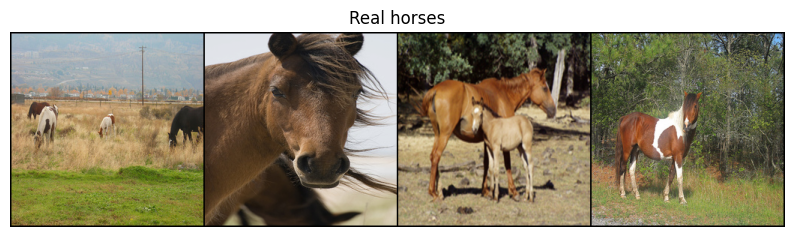

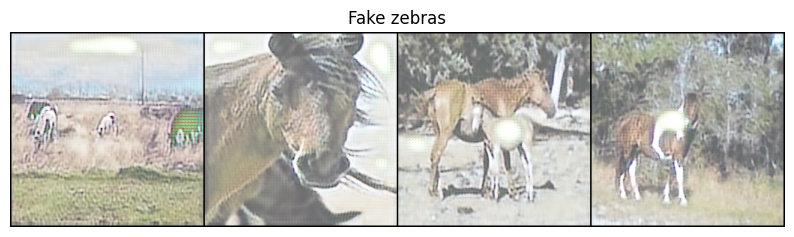

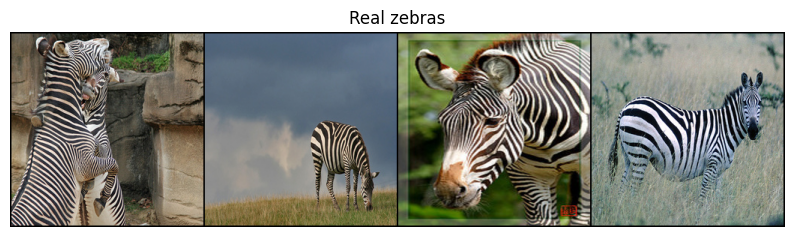

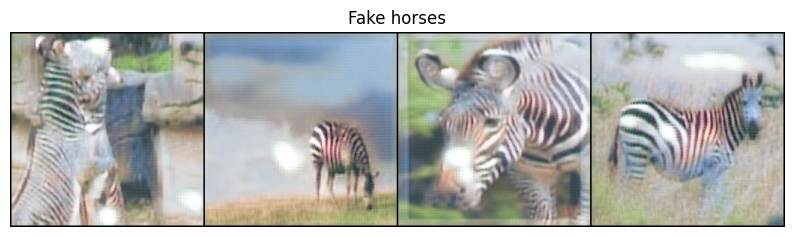

[2/20]	FDL_A2B: 0.3908	FDL_B2A: 0.4043	CL_A: 0.4966	CL_B: 0.6725	ID_B2A: 0.7968	ID_A2B: 1.2273	Loss_D_A: 0.4432	Loss_D_A: 0.4249
[2/20]	FDL_A2B: 0.1972	FDL_B2A: 0.2402	CL_A: 0.5184	CL_B: 0.6359	ID_B2A: 0.9058	ID_A2B: 1.1159	Loss_D_A: 0.4654	Loss_D_A: 0.4307
[2/20]	FDL_A2B: 0.2764	FDL_B2A: 0.5172	CL_A: 0.6767	CL_B: 0.6071	ID_B2A: 1.4198	ID_A2B: 0.9650	Loss_D_A: 0.5161	Loss_D_A: 0.5403
[2/20]	FDL_A2B: 0.3961	FDL_B2A: 0.5267	CL_A: 0.5464	CL_B: 0.6160	ID_B2A: 0.9435	ID_A2B: 1.1631	Loss_D_A: 0.7501	Loss_D_A: 0.4880
[3/20]	FDL_A2B: 0.4144	FDL_B2A: 0.3535	CL_A: 0.5175	CL_B: 0.7172	ID_B2A: 0.9116	ID_A2B: 1.2382	Loss_D_A: 0.4413	Loss_D_A: 0.5541
[3/20]	FDL_A2B: 0.2305	FDL_B2A: 0.1559	CL_A: 0.5806	CL_B: 0.6097	ID_B2A: 1.0841	ID_A2B: 0.9073	Loss_D_A: 0.3156	Loss_D_A: 0.3480
[3/20]	FDL_A2B: 0.3053	FDL_B2A: 0.4069	CL_A: 0.6086	CL_B: 0.6437	ID_B2A: 1.0363	ID_A2B: 1.1121	Loss_D_A: 0.4952	Loss_D_A: 0.4907
[3/20]	FDL_A2B: 0.4923	FDL_B2A: 0.4315	CL_A: 0.6259	CL_B: 0.5692	ID_B2A: 1.0455	ID_A2B: 0.9090	Lo

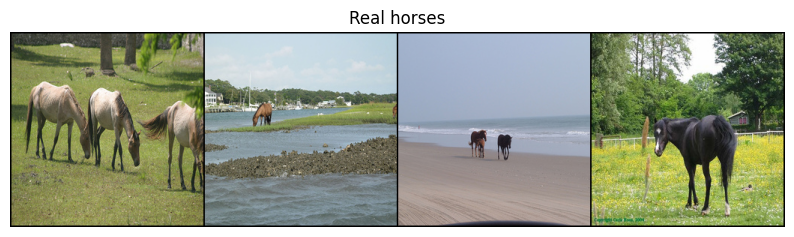

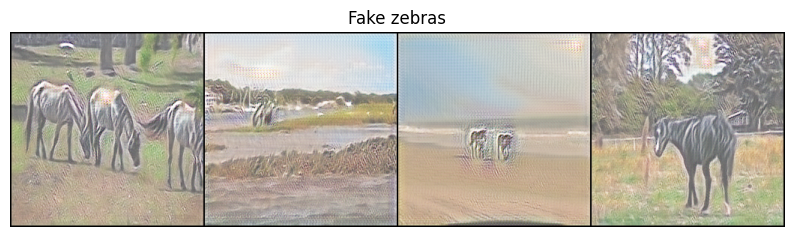

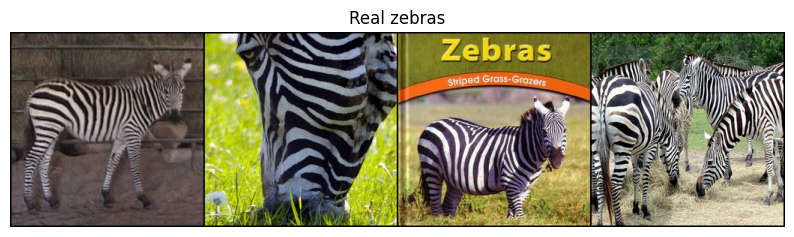

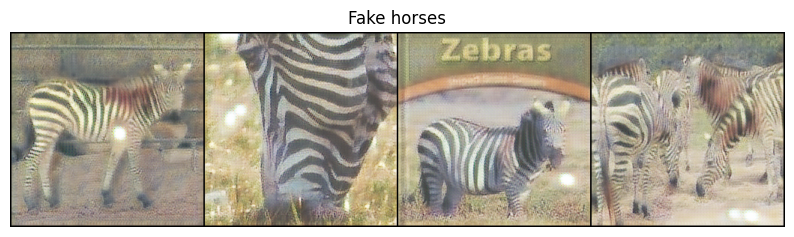

[6/20]	FDL_A2B: 0.6049	FDL_B2A: 0.2496	CL_A: 0.4420	CL_B: 0.4954	ID_B2A: 0.7490	ID_A2B: 0.8814	Loss_D_A: 0.5203	Loss_D_A: 0.7808
[6/20]	FDL_A2B: 0.1254	FDL_B2A: 0.1913	CL_A: 0.6421	CL_B: 0.6425	ID_B2A: 1.1164	ID_A2B: 1.0785	Loss_D_A: 0.4006	Loss_D_A: 0.1821
[6/20]	FDL_A2B: 0.7183	FDL_B2A: 0.3291	CL_A: 0.4276	CL_B: 0.5051	ID_B2A: 0.6711	ID_A2B: 0.8914	Loss_D_A: 0.4024	Loss_D_A: 0.4144
[6/20]	FDL_A2B: 0.5324	FDL_B2A: 0.2806	CL_A: 0.4604	CL_B: 0.4114	ID_B2A: 0.9071	ID_A2B: 0.7197	Loss_D_A: 0.5025	Loss_D_A: 0.4774
[7/20]	FDL_A2B: 0.5951	FDL_B2A: 0.2889	CL_A: 0.4563	CL_B: 0.5286	ID_B2A: 0.7802	ID_A2B: 0.8619	Loss_D_A: 0.4250	Loss_D_A: 0.5170
[7/20]	FDL_A2B: 0.1648	FDL_B2A: 0.3905	CL_A: 0.6030	CL_B: 0.5832	ID_B2A: 0.9396	ID_A2B: 1.0292	Loss_D_A: 0.4514	Loss_D_A: 0.4062
[7/20]	FDL_A2B: 0.3823	FDL_B2A: 0.3539	CL_A: 0.3874	CL_B: 0.4921	ID_B2A: 0.6497	ID_A2B: 0.8778	Loss_D_A: 0.5028	Loss_D_A: 0.4149
[7/20]	FDL_A2B: 0.4031	FDL_B2A: 0.3625	CL_A: 0.4836	CL_B: 0.4707	ID_B2A: 0.6974	ID_A2B: 0.8566	Lo

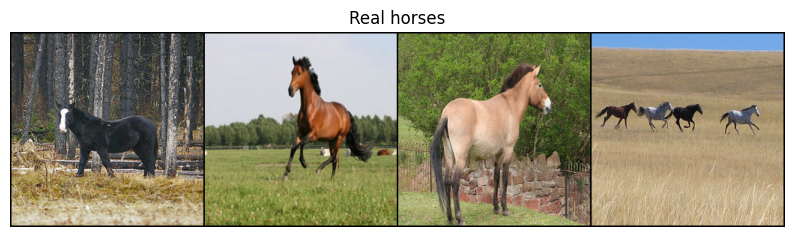

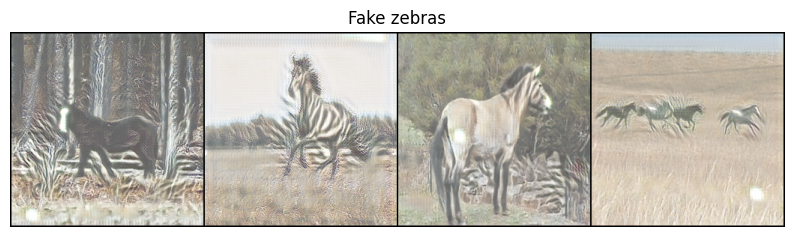

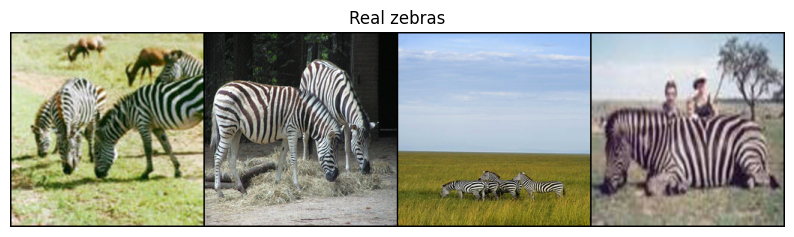

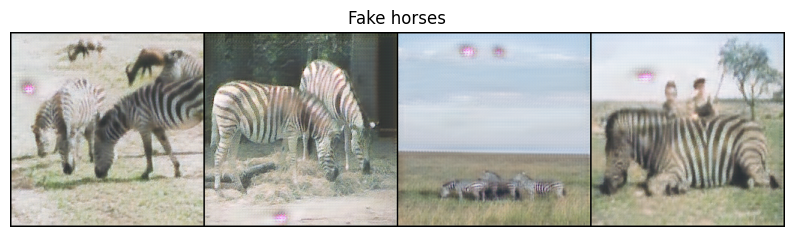

[11/20]	FDL_A2B: 0.6366	FDL_B2A: 0.3800	CL_A: 0.5441	CL_B: 0.5028	ID_B2A: 0.9382	ID_A2B: 0.8595	Loss_D_A: 0.5546	Loss_D_A: 0.3192
[11/20]	FDL_A2B: 0.3354	FDL_B2A: 0.1778	CL_A: 0.6553	CL_B: 0.4710	ID_B2A: 1.0053	ID_A2B: 0.7185	Loss_D_A: 0.3197	Loss_D_A: 0.3607
[11/20]	FDL_A2B: 0.3524	FDL_B2A: 0.4915	CL_A: 0.4387	CL_B: 0.4965	ID_B2A: 0.7645	ID_A2B: 0.8236	Loss_D_A: 0.3966	Loss_D_A: 0.4377
[11/20]	FDL_A2B: 0.4980	FDL_B2A: 0.4057	CL_A: 0.5172	CL_B: 0.5291	ID_B2A: 0.7751	ID_A2B: 0.8898	Loss_D_A: 0.3822	Loss_D_A: 0.4289
[12/20]	FDL_A2B: 0.3575	FDL_B2A: 0.2810	CL_A: 0.4033	CL_B: 0.4562	ID_B2A: 0.7125	ID_A2B: 0.7748	Loss_D_A: 0.5105	Loss_D_A: 0.4224
[12/20]	FDL_A2B: 0.2947	FDL_B2A: 0.1542	CL_A: 0.4510	CL_B: 0.4559	ID_B2A: 0.7412	ID_A2B: 0.8243	Loss_D_A: 0.3586	Loss_D_A: 0.5392
[12/20]	FDL_A2B: 0.5124	FDL_B2A: 0.3397	CL_A: 0.4743	CL_B: 0.5981	ID_B2A: 0.8051	ID_A2B: 1.1210	Loss_D_A: 0.4310	Loss_D_A: 0.4841
[12/20]	FDL_A2B: 0.5360	FDL_B2A: 0.2428	CL_A: 0.4704	CL_B: 0.5073	ID_B2A: 0.6877	ID_A2B: 0

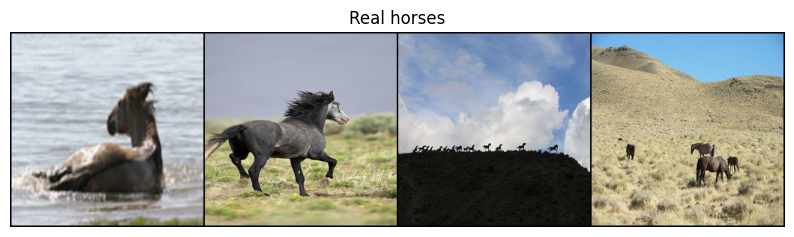

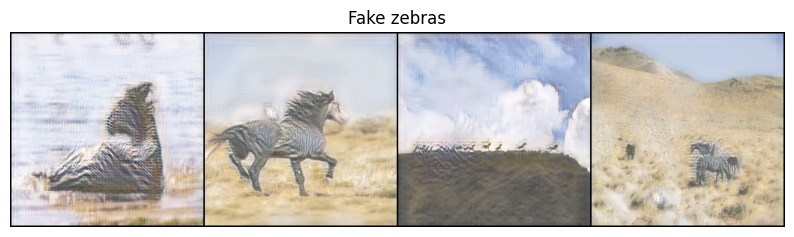

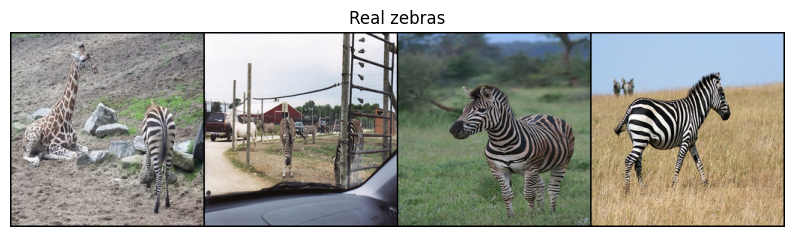

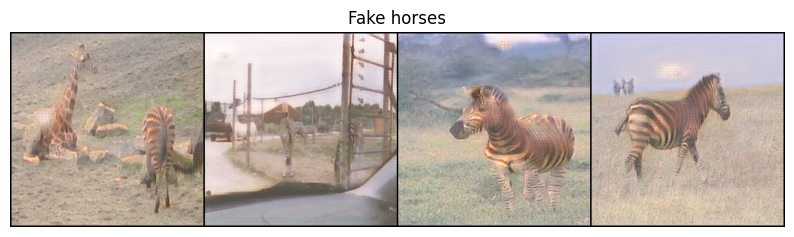

[16/20]	FDL_A2B: 0.5132	FDL_B2A: 0.4289	CL_A: 0.3800	CL_B: 0.4292	ID_B2A: 0.5266	ID_A2B: 0.6420	Loss_D_A: 0.3370	Loss_D_A: 0.3394
[16/20]	FDL_A2B: 0.2643	FDL_B2A: 0.2622	CL_A: 0.3743	CL_B: 0.4212	ID_B2A: 0.7320	ID_A2B: 0.5897	Loss_D_A: 0.3053	Loss_D_A: 0.3809
[16/20]	FDL_A2B: 0.4471	FDL_B2A: 0.3532	CL_A: 0.4337	CL_B: 0.4277	ID_B2A: 0.6977	ID_A2B: 0.7277	Loss_D_A: 0.4632	Loss_D_A: 0.4736
[16/20]	FDL_A2B: 0.4180	FDL_B2A: 0.3244	CL_A: 0.4590	CL_B: 0.4837	ID_B2A: 0.7675	ID_A2B: 0.7759	Loss_D_A: 0.4813	Loss_D_A: 0.4171
[17/20]	FDL_A2B: 0.5211	FDL_B2A: 0.4134	CL_A: 0.3370	CL_B: 0.4756	ID_B2A: 0.5594	ID_A2B: 0.8104	Loss_D_A: 0.4046	Loss_D_A: 0.2724
[17/20]	FDL_A2B: 0.2688	FDL_B2A: 0.3734	CL_A: 0.4429	CL_B: 0.5139	ID_B2A: 0.6840	ID_A2B: 0.8185	Loss_D_A: 0.3340	Loss_D_A: 0.3293
[17/20]	FDL_A2B: 0.4127	FDL_B2A: 0.3758	CL_A: 0.4269	CL_B: 0.4881	ID_B2A: 0.7149	ID_A2B: 0.7755	Loss_D_A: 0.5228	Loss_D_A: 0.3967
[17/20]	FDL_A2B: 0.6069	FDL_B2A: 0.4929	CL_A: 0.5642	CL_B: 0.4499	ID_B2A: 0.9668	ID_A2B: 0

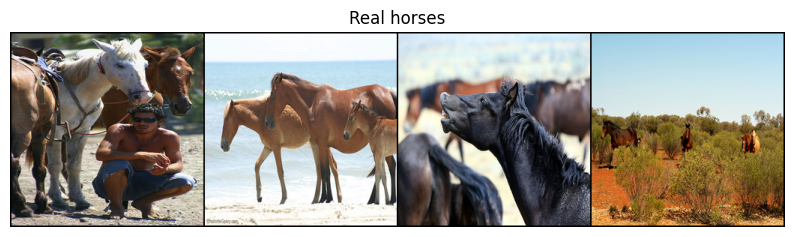

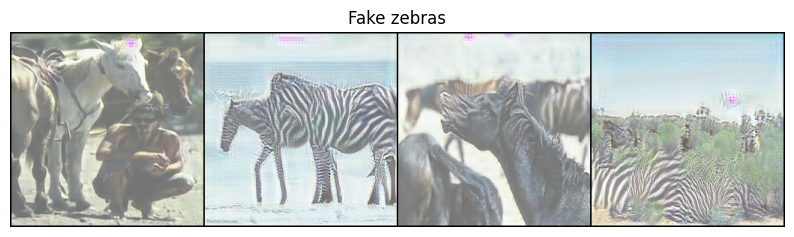

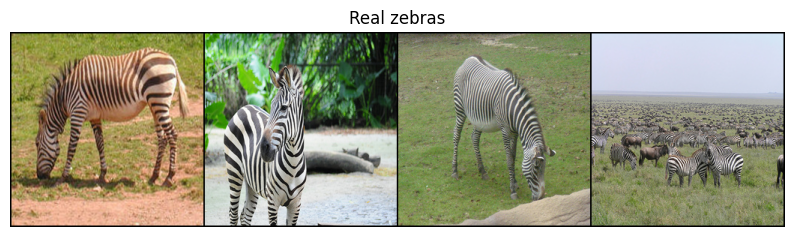

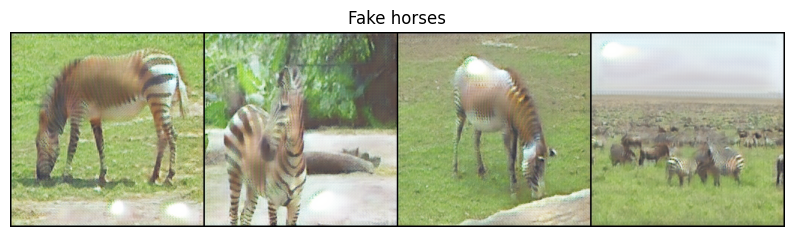

In [17]:
name="my_model"

EPOCHS = 20
netG_A2B, netG_B2A, netD_A, netD_B = G_A2B, G_B2A, D_A, D_B

optimizer_G_A2B = torch.optim.Adam(G_A2B.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_G_B2A = torch.optim.Adam(G_B2A.parameters(), lr=lr, betas=(beta1, 0.999))

optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=(beta1, 0.999))

losses = training(netG_A2B, netG_B2A, netD_A, netD_B, EPOCHS, name)

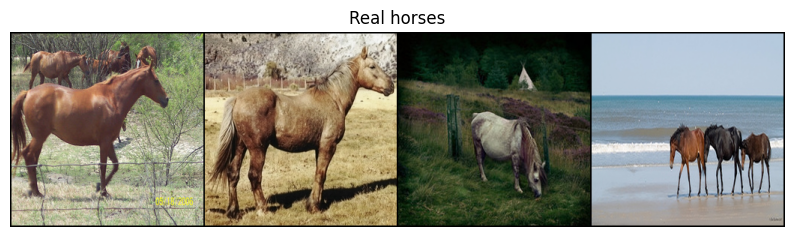

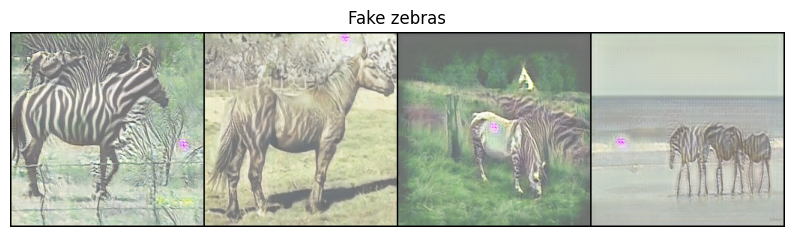

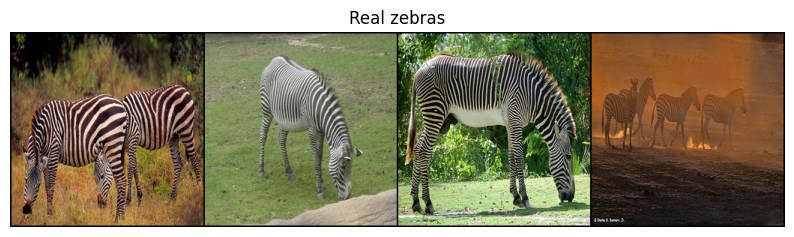

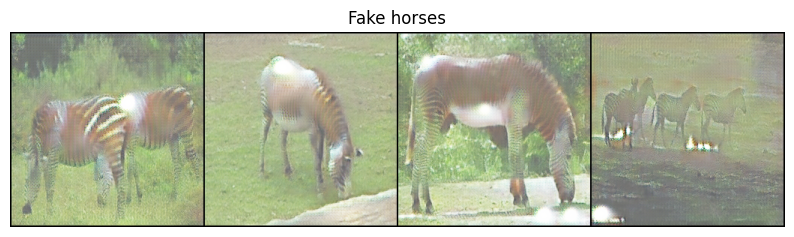

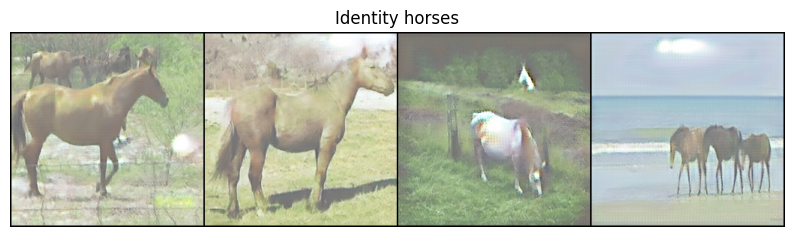

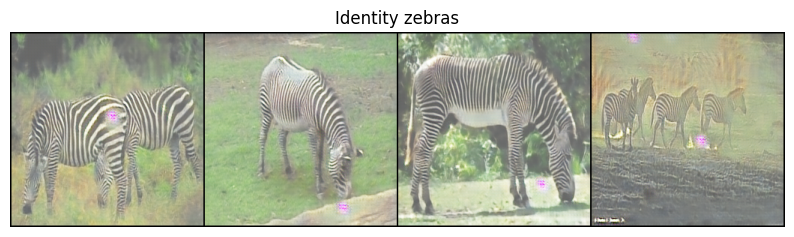

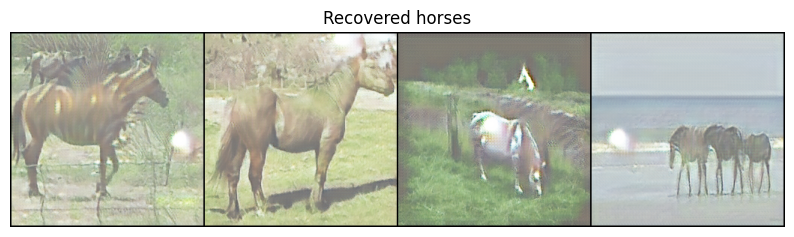

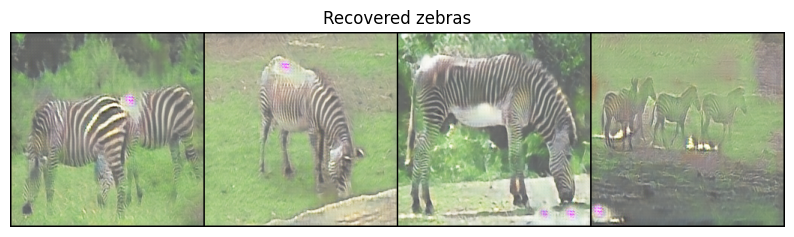

In [21]:
plot_all_images(4, dataloader_test_horses, dataloader_zebra_test)